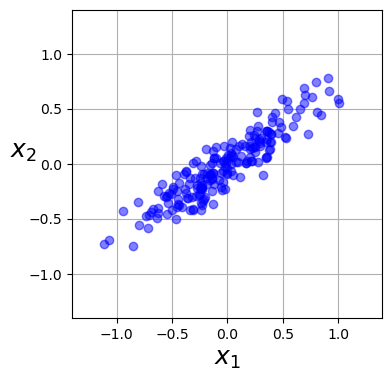

In [1]:
import numpy as np
import matplotlib.pyplot as plt

angle = np.pi/5
stretch = 5
m = 200

np.random.seed(0)
X = np.random.randn(m, 2)/10
X = X.dot(np.array([[stretch, 0],[0, 1]])) # stretch
X = X.dot([[np.cos(angle), np.sin(angle)], [-np.sin(angle), np.cos(angle)]]) # rotate

plt.figure(figsize=(4,4))
plt.plot(X[:, 0], X[:, 1], "bo", alpha=0.5)
plt.axis([-1.4, 1.4, -1.4, 1.4])
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$x_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.show()

### Feature scaling

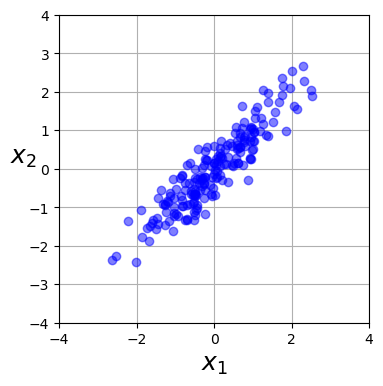

In [2]:
from sklearn.preprocessing import StandardScaler

X_scaled = StandardScaler().fit_transform(X)

plt.figure(figsize=(4,4))
plt.plot(X_scaled[:, 0], X_scaled[:, 1], "bo", alpha=0.5)
plt.axis([-4, 4, -4, 4])
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$x_2$", fontsize=18, rotation=0)
plt.grid(True)


### Covariance matrix of the original data

In [3]:
np.cov(X_scaled.T) 

array([[1.00502513, 0.92261703],
       [0.92261703, 1.00502513]])

We can see that the two features are highly correlated with each other (off-diagonal values are close to one).

### Apply PCA

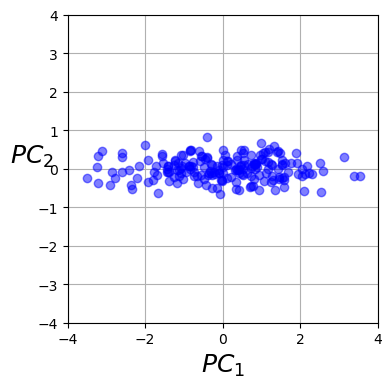

In [4]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2) #specify we want 2-dimensions

X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(4,4))
plt.plot(X_pca[:, 0], X_pca[:, 1], "bo", alpha=0.5)
plt.axis([-4, 4, -4, 4])
plt.xlabel("$PC_1$", fontsize=18)
plt.ylabel("$PC_2$", fontsize=18, rotation=0)
plt.grid(True)

### Eigenvectors

In [7]:
pca.components_ # these are the vectors of each PC

array([[-0.70710678, -0.70710678],
       [ 0.70710678, -0.70710678]])

### Visualizing Eigenvectors

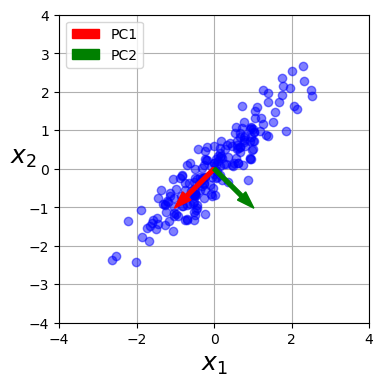

In [8]:
plt.figure(figsize=(4,4))
plt.plot(X_scaled[:, 0], X_scaled[:, 1], "bo", alpha=0.5)

# Plotting PC1
plt.arrow(0,0,pca.components_[0,0],pca.components_[0,1], width=0.1, color='r', zorder=10, label='PC1')

# Plotting PC2
plt.arrow(0,0,pca.components_[1,0],pca.components_[1,1], width=0.1, color='g', zorder=10, label='PC2')

plt.axis([-4, 4, -4, 4])
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$x_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.legend()

### Variance along the PCs

In [9]:
pca.explained_variance_ # How much variance the data has along each PC

# PC1 has pretty large variance, PC2 has pretty small variance

array([1.92764216, 0.08240809])

### Let's check the covariance matrix after PCA.

In [10]:
np.cov(X_pca.T)

array([[ 1.92764216e+00, -1.67370305e-17],
       [-1.67370305e-17,  8.24080922e-02]])

The two PCs are uncorelated. Makes sense since PC2 is orthogonal to PC1

### Variance ratio along the PCs (i.e., importance of the "new" features)

In [11]:
np.cov(X_pca.T)[0,0], np.cov(X_pca.T)[1,1]

(1.9276421591026276, 0.08240809215365454)

In [12]:
pca.explained_variance_ratio_ #percentage

array([0.95900197, 0.04099803])

96% of information is along PC1, the other ~4% is along PC2.

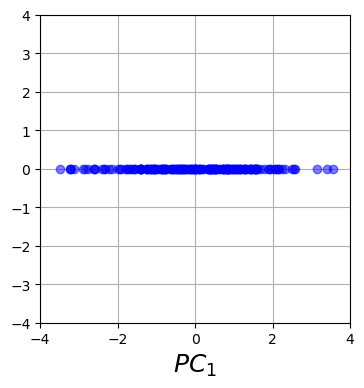

In [13]:
from sklearn.decomposition import PCA

pca = PCA(n_components=1) #now specify 1-dimension

X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(4,4))
plt.plot(X_pca[:, 0], np.zeros(X_pca.shape), "bo", alpha=0.5)

plt.axis([-4, 4, -4, 4])
plt.xlabel("$PC_1$", fontsize=18)
plt.grid(True)

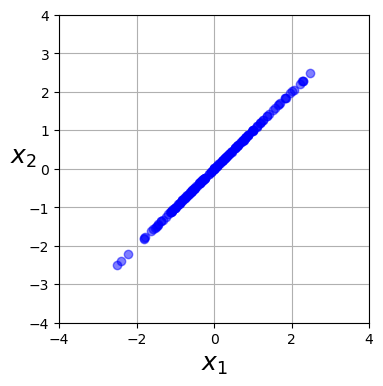

In [14]:
from sklearn.decomposition import PCA

X_inverse = pca.inverse_transform(X_pca)

plt.figure(figsize=(4,4))
plt.plot(X_inverse[:, 0], X_inverse[:, 1], "bo", alpha=0.5)

plt.axis([-4, 4, -4, 4])
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$x_2$", fontsize=18, rotation=0)
plt.grid(True)

### Dimensionality reduction is effective in removing highly correlated features.

### Let's play with the breast cancer dataset.
This example is adopted from: https://towardsdatascience.com/how-do-you-apply-pca-to-logistic-regression-to-remove-multicollinearity-10b7f8e89f9b

In [15]:
import pandas as pd
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()
df = pd.DataFrame(cancer.data, columns=cancer.feature_names)
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [16]:
cancer.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

### Let's plot correlation coefficients.

<AxesSubplot:>

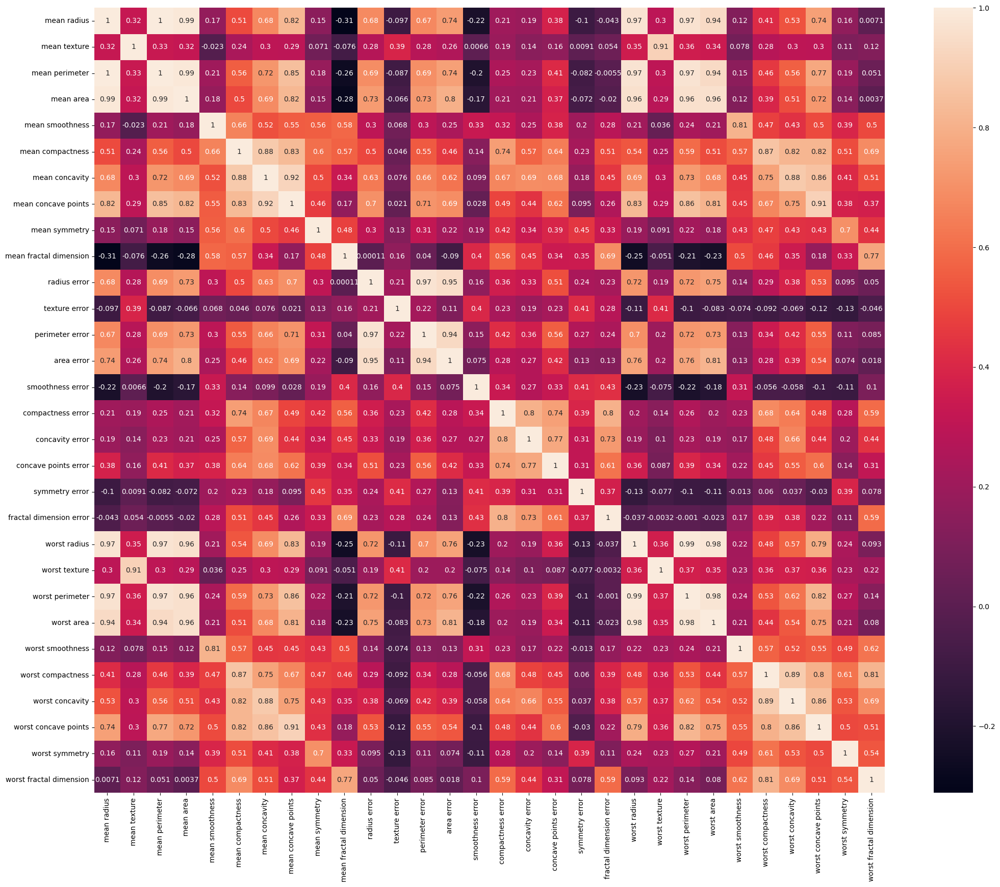

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25, 20))
sns.heatmap(df.corr(), annot=True)

### Let's make a DT model and check the performance.

Test score: 0.90


Text(50.722222222222214, 0.5, 'True')

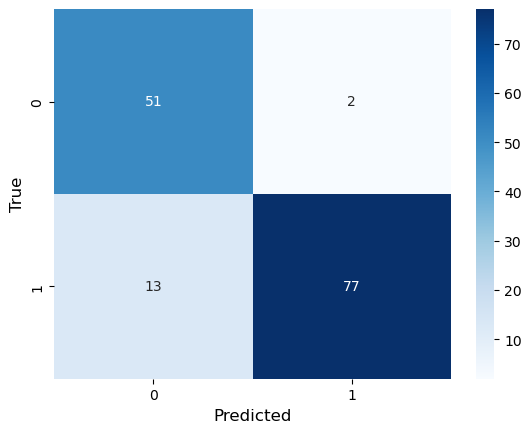

In [18]:
X = df
y = pd.Series(cancer.target)

# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(max_depth=5, random_state=0)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test) 

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np

print("Test score: {:.2f}".format(model.score(X_test, y_test)))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix

cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

### Let's check how many components we want in PCA

Variances (Percentage):
[4.42720256e+01 1.89711820e+01 9.39316326e+00 6.60213492e+00
 5.49576849e+00 4.02452204e+00 2.25073371e+00 1.58872380e+00
 1.38964937e+00 1.16897819e+00 9.79718988e-01 8.70537901e-01
 8.04524987e-01 5.23365745e-01 3.13783217e-01 2.66209337e-01
 1.97996793e-01 1.75395945e-01 1.64925306e-01 1.03864675e-01
 9.99096464e-02 9.14646751e-02 8.11361259e-02 6.01833567e-02
 5.16042379e-02 2.72587995e-02 2.30015463e-02 5.29779290e-03
 2.49601032e-03 4.43482743e-04]

Cumulative Variance (Percentage):
[ 44.27202561  63.24320765  72.63637091  79.23850582  84.73427432
  88.75879636  91.00953007  92.59825387  93.98790324  95.15688143
  96.13660042  97.00713832  97.81166331  98.33502905  98.64881227
  98.91502161  99.1130184   99.28841435  99.45333965  99.55720433
  99.65711397  99.74857865  99.82971477  99.88989813  99.94150237
  99.96876117  99.99176271  99.99706051  99.99955652 100.        ]



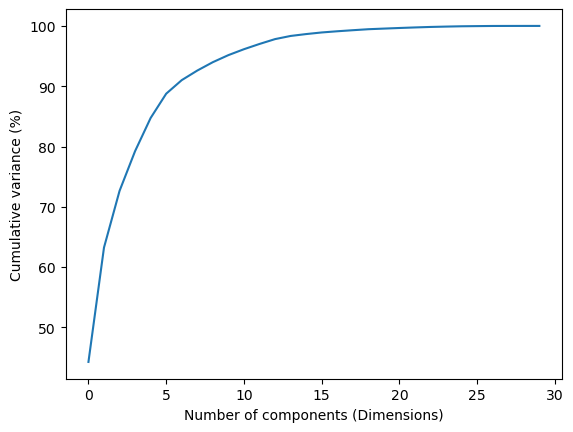

In [19]:
# feature scaling
from sklearn.preprocessing import StandardScaler

X_scaled = StandardScaler().fit_transform(X)

# Apply PCA
from sklearn.decomposition import PCA

model = PCA()
model.fit(X_scaled)

# Get explained variances
print("Variances (Percentage):")
print(model.explained_variance_ratio_ * 100)
print()

print("Cumulative Variance (Percentage):")
print(np.cumsum(model.explained_variance_ratio_ * 100))
print()

# Make the scree plot
plt.plot(np.cumsum(model.explained_variance_ratio_ * 100))
plt.xlabel("Number of components (Dimensions)")
plt.ylabel("Cumulative variance (%)")

plt.savefig('explained_variance.png',dpi=300)

In [20]:
# feature scaling
from sklearn.preprocessing import StandardScaler

X_scaled = StandardScaler().fit_transform(X)

# Apply PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=7) #Specify number of dimensions you want to go to

# This is the data in the "new" low-dimensional feature space.
X_pca = pca.fit_transform(X_scaled)
X_pca = pd.DataFrame(X_pca)
X_pca

,0,1,2,3,4,5,6
0,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411422,2.159382
1,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028658,0.013345
2,5.733896,-1.075174,-0.551748,0.912082,-0.177086,0.541454,-0.668182
3,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429909
4,3.935302,-1.948072,1.389767,2.940640,0.546747,-1.226496,-0.936196
...,...,...,...,...,...,...,...
564,6.439315,-3.576817,2.459487,1.177314,-0.074824,-2.375192,-0.596141
565,3.793382,-3.584048,2.088476,-2.506028,-0.510723,-0.246709,-0.716335
566,1.256179,-1.902297,0.562731,-2.089227,1.809991,-0.534447,-0.192760
567,10.374794,1.672010,-1.877029,-2.356031,-0.033742,0.567934,0.223096


### Let's check correlation coefficients of the transformed data.

<AxesSubplot:>

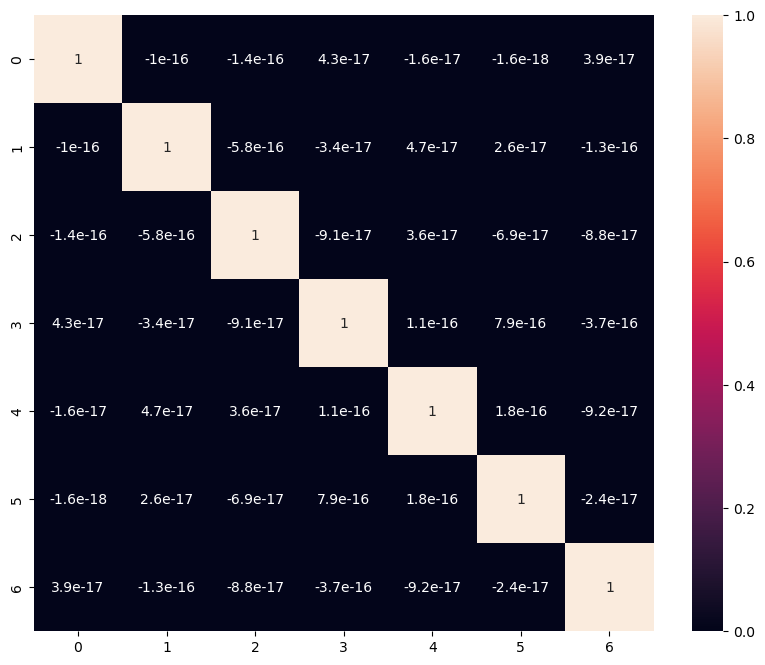

In [21]:
fig = plt.figure(figsize=(10, 8))
sns.heatmap(X_pca.corr(), annot=True)

The 7 PC's are not correlated with each other (good).

### Another way to do this is to determine how much variance you'd like to keep.

In [22]:
# feature scaling
from sklearn.preprocessing import StandardScaler

X_scaled = StandardScaler().fit_transform(X)

# Apply PCA, 90% variance
from sklearn.decomposition import PCA
pca = PCA(n_components=0.9) #Specify the fraction of variance you want to keep (number between 0-1)

# This is the data in the "new" low-dimensional feature space.
X_pca = pca.fit_transform(X_scaled)
X_pca = pd.DataFrame(X_pca)
X_pca

,0,1,2,3,4,5,6
0,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411424,2.159370
1,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028656,0.013358
2,5.733896,-1.075174,-0.551748,0.912083,-0.177086,0.541452,-0.668166
3,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429911
4,3.935302,-1.948072,1.389767,2.940639,0.546747,-1.226495,-0.936213
...,...,...,...,...,...,...,...
564,6.439315,-3.576817,2.459487,1.177314,-0.074824,-2.375193,-0.596130
565,3.793382,-3.584048,2.088476,-2.506028,-0.510723,-0.246710,-0.716326
566,1.256179,-1.902297,0.562731,-2.089227,1.809991,-0.534447,-0.192758
567,10.374794,1.672010,-1.877029,-2.356031,-0.033742,0.567936,0.223082


### Fractional variance and the number of components to achieve that fractional variance.

In [23]:
pca.n_components, pca.n_components_
#(fraction, actual number of dimensions)

(0.9, 7)

### Let's make a DT model using the "PCA-ed" data.

Test score: 0.90

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

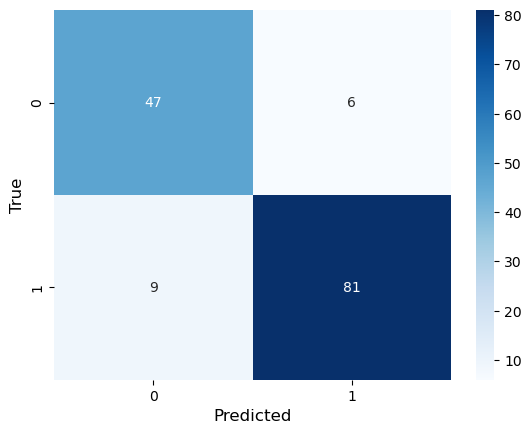

In [24]:
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, random_state=0)

from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(max_depth=5, random_state=0)

# Train the model
model.fit(X_train_pca, y_train)

# Make predictions
y_pred = model.predict(X_test_pca) # Predictions

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Test score: {:.2f}".format(model.score(X_test_pca, y_test)))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

We got the same accuracy of 0.9 in the lower dimensional space (7 vs. 30), which is great!

### Let's move to even higher-dimesional space.  We will use the MNIST dataset.

In [25]:
from sklearn.datasets import fetch_openml
import numpy as np

mnist = fetch_openml('mnist_784', version=1, as_frame=False)
mnist.target = mnist.target.astype(np.uint8)

In [26]:
from sklearn.model_selection import train_test_split

X = mnist["data"]
y = mnist["target"]

#Take 10% of data
X = X[::10]
y = y[::10]

X_train, X_test, y_train, y_test = train_test_split(X, y)

In [27]:
X_train.shape

(5250, 784)

### TODO: Make a kNN model using k=10 without PCA. Print out test score so that we can compare the performance.

In [28]:
import warnings
warnings.filterwarnings("ignore")

In [30]:
from sklearn import neighbors
from sklearn.preprocessing import StandardScaler

X_train_scaled = StandardScaler().fit(X_train).transform(X_train)
X_test_scaled = StandardScaler().fit(X_train).transform(X_test)

model = neighbors.KNeighborsClassifier(n_neighbors=10)

model.fit(X_train_scaled, y_train)

print('Test Score = ',model.score(X_test_scaled, y_test))


Test Score =  0.8805714285714286


### TODO: Now apply PCA before we make a kNN model while keeping 90% variance.

In [31]:
pca = PCA(n_components=0.9) #Specify the fraction of variance you want to keep (number between 0-1)

X_scaled = StandardScaler().fit_transform(X)

# This is the data in the "new" low-dimensional feature space.
X_pca = pca.fit_transform(X_scaled)
X_pca = pd.DataFrame(X_pca)
X_pca


,0,1,2,3,4,5,6,7,8,9,...,177,178,179,180,181,182,183,184,185,186
0,-1.245148,-6.059246,-5.274162,-8.001526,3.602079,5.317340,1.296532,0.671337,0.291630,2.245863,...,-0.597951,0.655530,1.067775,-0.388466,-0.911558,-1.008187,0.443909,-1.574632,0.503908,-0.887918
1,-3.747564,-6.274184,0.895849,-4.639774,1.659576,0.675210,-1.153049,4.364480,0.396689,2.840790,...,-0.087878,-0.171905,0.560706,0.917236,0.033809,0.206348,-0.089616,-0.599698,-0.076989,0.277381
2,7.571099,11.247416,7.312461,-2.698149,-2.553597,6.662371,9.005601,0.830213,5.785491,-0.813051,...,-0.448083,-0.440997,0.132269,-1.920744,2.085374,-1.789354,-0.102573,0.728530,-0.227795,-0.350039
3,-0.677518,5.330178,7.142292,-1.393892,3.612219,-1.315798,1.671965,8.564122,5.742212,-0.070471,...,1.379443,0.947428,0.447289,-2.167208,-0.227790,-0.066289,1.778970,0.312212,0.234374,0.032508
4,-8.639062,-2.328051,0.840884,3.778944,5.689320,-2.610797,0.470171,0.049194,1.729442,-1.770038,...,-0.013734,-0.300751,0.108194,-0.142830,-0.146972,-0.185383,0.084268,0.373299,0.176022,-0.484825
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6995,-5.656678,-3.254303,0.291630,1.968667,3.964586,1.102381,2.997677,-4.482280,-1.371512,-1.917125,...,-1.563953,-0.128702,0.117718,-0.501032,-0.228398,-0.475990,0.598774,-0.118238,0.187839,0.117866
6996,-2.594203,5.808771,-4.090361,1.932811,-3.963839,3.337234,-3.123662,-3.524327,-2.844554,-0.136312,...,0.070088,0.136074,0.702856,-0.687871,0.146083,-0.904205,-0.536777,1.116171,0.646403,-0.329574
6997,-0.957449,-6.932958,-3.023390,2.539150,0.248546,0.539296,5.533530,5.560131,0.746539,3.518187,...,-0.145327,0.509144,1.632773,0.429912,1.243223,-0.493725,0.392669,0.574272,-0.254491,1.385654
6998,14.718983,-5.879619,-4.956238,-7.992041,7.762177,16.959483,1.178443,3.416060,0.244557,5.488514,...,-1.352606,0.236904,0.441319,-1.322446,-1.748477,-3.628785,-0.501084,0.663648,1.630382,0.602883


In [33]:
# Split training and testing with new PCA data
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, random_state=0)

model = neighbors.KNeighborsClassifier(n_neighbors=10)

model.fit(X_train_pca, y_train)

print('Test score = ',model.score(X_test_pca, y_test))


Test score =  0.896


### Q: How many components did you end up keeping and how does that compare with the original dimension (i.e., 784)?

In [34]:
pca.n_components, pca.n_components_

(0.9, 187)

I ended up keeping 187 components, about 23% of the original dimension. The test score was higher for the PCA data.

### TODO: Compare some of the original images and their inverse transformed images from the data that contain only 90% of the original information.

In [74]:
X_train.shape, X_scaled.shape


((5250, 784), (7000, 784))

In [70]:
inverse = pca.inverse_transform(X_pca)

In [71]:
inverse.shape

(7000, 784)

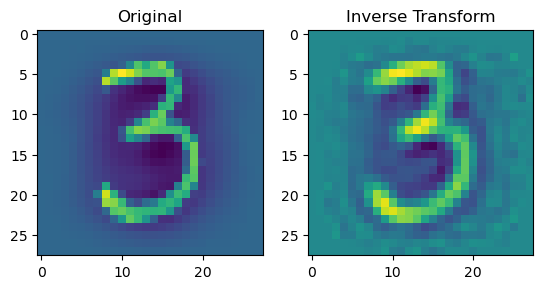

In [84]:
num = 5

plt.subplot(1,2,1)
plt.imshow(X_scaled.reshape(7000,28,28)[num])
plt.title('Original')

plt.subplot(1,2,2)
plt.imshow(inverse.reshape(7000,28,28)[num])
plt.title('Inverse Transform');

### Now, let's plot some of the Eigenvectors.

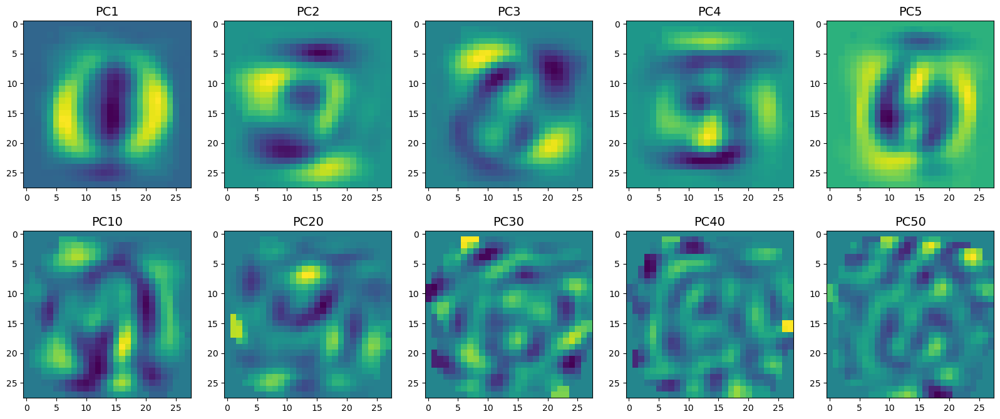

In [42]:
plt.figure(figsize=(20,8));

plt.subplot(2, 5, 1)
plt.imshow(pca.components_[0].reshape(28,28))
plt.title('PC1', fontsize = 14);

plt.subplot(2, 5, 2)
plt.imshow(pca.components_[1].reshape(28,28))
plt.title('PC2', fontsize = 14);

plt.subplot(2, 5, 3)
plt.imshow(pca.components_[2].reshape(28,28))
plt.title('PC3', fontsize = 14);

plt.subplot(2, 5, 4)
plt.imshow(pca.components_[3].reshape(28,28))
plt.title('PC4', fontsize = 14);

plt.subplot(2, 5, 5)
plt.imshow(pca.components_[4].reshape(28,28))
plt.title('PC5', fontsize = 14);

plt.subplot(2, 5, 6)
plt.imshow(pca.components_[9].reshape(28,28))
plt.title('PC10', fontsize = 14);

plt.subplot(2, 5, 7)
plt.imshow(pca.components_[19].reshape(28,28))
plt.title('PC20', fontsize = 14);

plt.subplot(2, 5, 8)
plt.imshow(pca.components_[29].reshape(28,28))
plt.title('PC30', fontsize = 14);

plt.subplot(2, 5, 9)
plt.imshow(pca.components_[39].reshape(28,28))
plt.title('PC40', fontsize = 14);

plt.subplot(2, 5, 10)
plt.imshow(pca.components_[49].reshape(28,28))
plt.title('PC50', fontsize = 14);


### Q: What does the figure tell us?

Eigenvectors tell us at which pixels there is the most variance for each PC

### PCA for Galaxy Zoo data

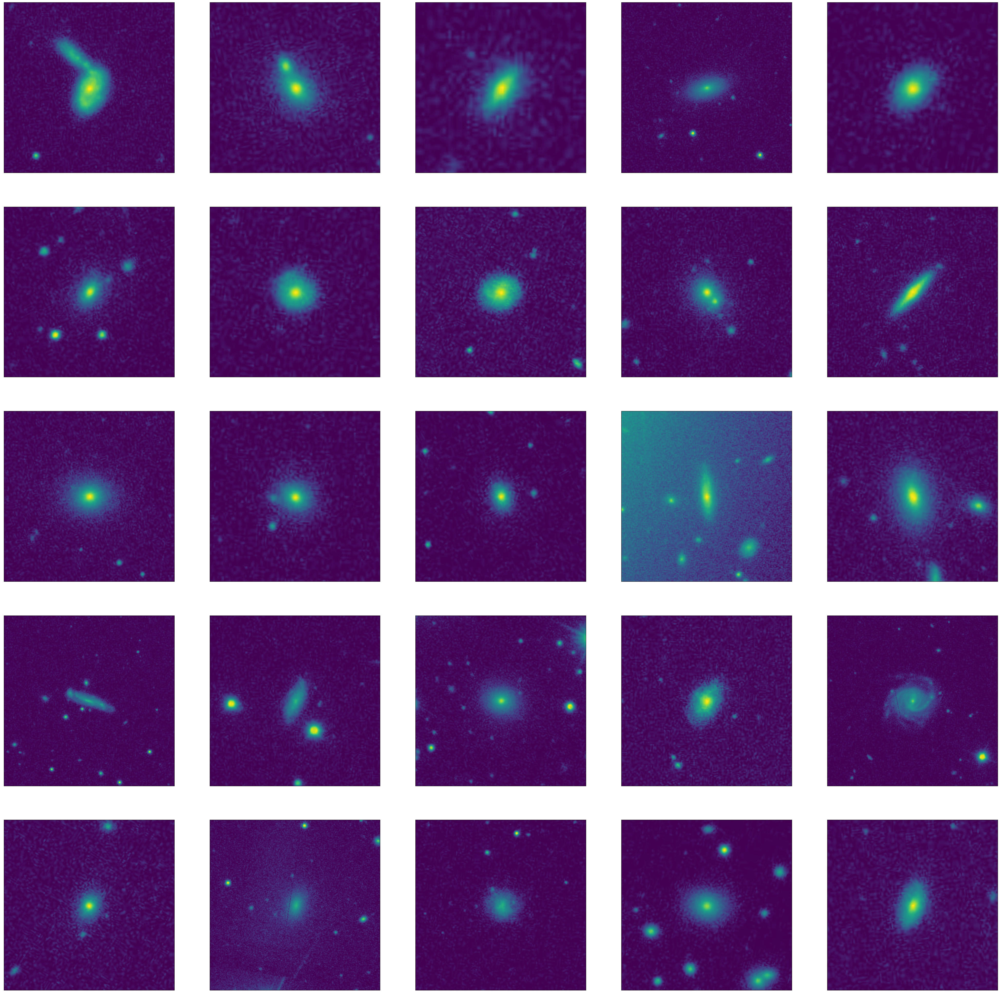

In [1]:
# If you need to install skimage, see https://scikit-image.org/docs/stable/install.html

import glob
import skimage
from skimage.transform import resize, rescale
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

path = './galaxyzoo/'

images = []

fig, axes = plt.subplots(ncols= 5, nrows = 5, figsize=(50,50))

ax = axes.ravel()

for i, file in enumerate(glob.glob(path+"*")):
    img = skimage.io.imread(file)
    img = img.mean(axis=2)
    if i < 25:
        ax[i].imshow(img)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    img_resized = resize(img,(100,100))
    length = np.prod(img_resized.shape)
    img_resized = np.reshape(img_resized,length)
    images.append(img_resized)
    
images = np.vstack(images)

images /= 255 # normalize such that each pixel is in between 0 and 1

In [2]:
images.shape # We have 133 images which are 100x100

(133, 10000)

### TODO: Compute mean squared error when you keep 80%, 90%, and 95% of the variance. How does the error vary?

In [21]:
from sklearn.decomposition import PCA

# Keep 80% of the variance
pca = PCA(n_components=0.8)
image_pca = pca.fit_transform(images)
image_inverse = pca.inverse_transform(image_pca)
pca.explained_variance_
pca.noise_variance_
# Confused by what is meant by "how does the error vary?"


0.04428652156043079

In [22]:
# Keep 90% of the variance
pca = PCA(n_components=0.9)
image_pca = pca.fit_transform(images)
image_inverse = pca.inverse_transform(image_pca)
pca.explained_variance_
pca.noise_variance_

0.02901619468454028

In [23]:
# Keep 95% of the variance
pca = PCA(n_components=0.95)
image_pca = pca.fit_transform(images)
image_inverse = pca.inverse_transform(image_pca)
pca.explained_variance_
pca.noise_variance_

0.0208659221468193

### TODO: Keep 90% of the variance and apply PCA.

In [28]:
pca = PCA(n_components=0.9)
image_pca = pca.fit_transform(images)
image_inverse = pca.inverse_transform(image_pca)



In [30]:
image_inverse.shape, image_pca.shape

((133, 10000), (133, 52))

### TODO: Inverse transform the PCA-ed images. Make figures showing (1) original image, (2) inverse transformed image, and (3) the difference between the two.

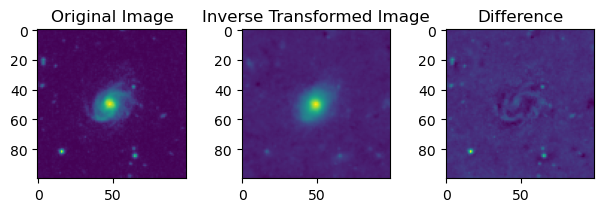

In [50]:
gal_num = 90 #Specify which of the 133 images you want to look at

plt.subplot(1,3,1)
plt.imshow(images[gal_num].reshape(100,100))
plt.title('Original Image')

plt.subplot(1,3,2)
plt.imshow(image_inverse[gal_num].reshape(100,100))
plt.title('Inverse Transformed Image')

plt.subplot(1,3,3)
difference = images[gal_num] - image_inverse[gal_num]
plt.imshow(difference.reshape(100,100))
plt.title('Difference')

plt.tight_layout(pad=2);
